In [1]:
# We need the Counter for processing the labels.
from collections import Counter, defaultdict

# We will need matplotlib for visualing our dataset and numpy to be able to handle the data.
import matplotlib.pyplot as plt
import numpy as np

# We are importing torch in order to create image embeddings.
# We are only using torchvision to load in the dataset.
# If you already have the data stored on your computer in a numpy friendly manner,
# then feel free to load it directly into numpy arrays.
import torch
import torch.nn as nn
import torchvision.transforms.v2 as v2
from torchvision import datasets, models

# Load the classes from DataEval that are helpful for EDA
from dataeval.detectors import Clusterer, Duplicates, Linter
from dataeval.metrics import ChannelStats, ImageStats

# Set the random value
rng = np.random.default_rng(213)

In [2]:
%%capture --no-display
# Download the data and then load it as a torch Tensor.
to_tensor = v2.ToImage()
ds = datasets.VOCDetection("./data", year="2011", image_set="train", download=True, transform=to_tensor)

In [3]:
# Verify the size of the loaded dataset
len(ds)

5717

In [4]:
img_list = []
for data in ds:
    img_list.append(data[0].numpy())

In [5]:
# Check the label structure
ds[0][1]

{'annotation': {'folder': 'VOC2011',
  'filename': '2008_000008.jpg',
  'source': {'database': 'The VOC2008 Database',
   'annotation': 'PASCAL VOC2008',
   'image': 'flickr'},
  'size': {'width': '500', 'height': '442', 'depth': '3'},
  'segmented': '0',
  'object': [{'name': 'horse',
    'pose': 'Left',
    'truncated': '0',
    'occluded': '1',
    'bndbox': {'xmin': '53', 'ymin': '87', 'xmax': '471', 'ymax': '420'},
    'difficult': '0'},
   {'name': 'person',
    'pose': 'Unspecified',
    'truncated': '1',
    'occluded': '0',
    'bndbox': {'xmin': '158', 'ymin': '44', 'xmax': '289', 'ymax': '167'},
    'difficult': '0'}]}}

In [6]:
labels = []
for data in ds:
    objects = data[1]["annotation"]["object"]
    names = []
    for each in objects:
        names.append(each["name"])
    labels.append(names)

labels[0]

['horse', 'person']

In [7]:
# This grabs the total number of each object labelled and the number and index of images each object is present in
object_counts = Counter()
image_counts = Counter()
index_location = defaultdict(list)

for i, group in enumerate(labels):
    # Count occurrences of each object in all sublists
    object_counts.update(group)

    # Create a set of unique items in the current sublist
    unique_items = set(group)

    # Update image counts and index locations
    image_counts.update(unique_items)
    for item in unique_items:
        index_location[item].append(i)

# Display the results
print("     Object: Total Count - Image Count")
for obj in list(object_counts.keys()):
    print(f"{obj:>11}:    {object_counts[obj]:>4}     -   {image_counts[obj]:>4}")

     Object: Total Count - Image Count
      horse:     377     -    238
     person:    5019     -   2142
     bottle:     749     -    399
        dog:     768     -    636
  tvmonitor:     412     -    299
        car:    1191     -    621
  aeroplane:     470     -    328
    bicycle:     410     -    281
       boat:     508     -    264
      chair:    1457     -    656
diningtable:     373     -    318
pottedplant:     557     -    289
      train:     327     -    275
        cat:     609     -    540
       sofa:     399     -    359
       bird:     592     -    399
      sheep:     509     -    171
  motorbike:     375     -    274
        bus:     317     -    219
        cow:     355     -    155


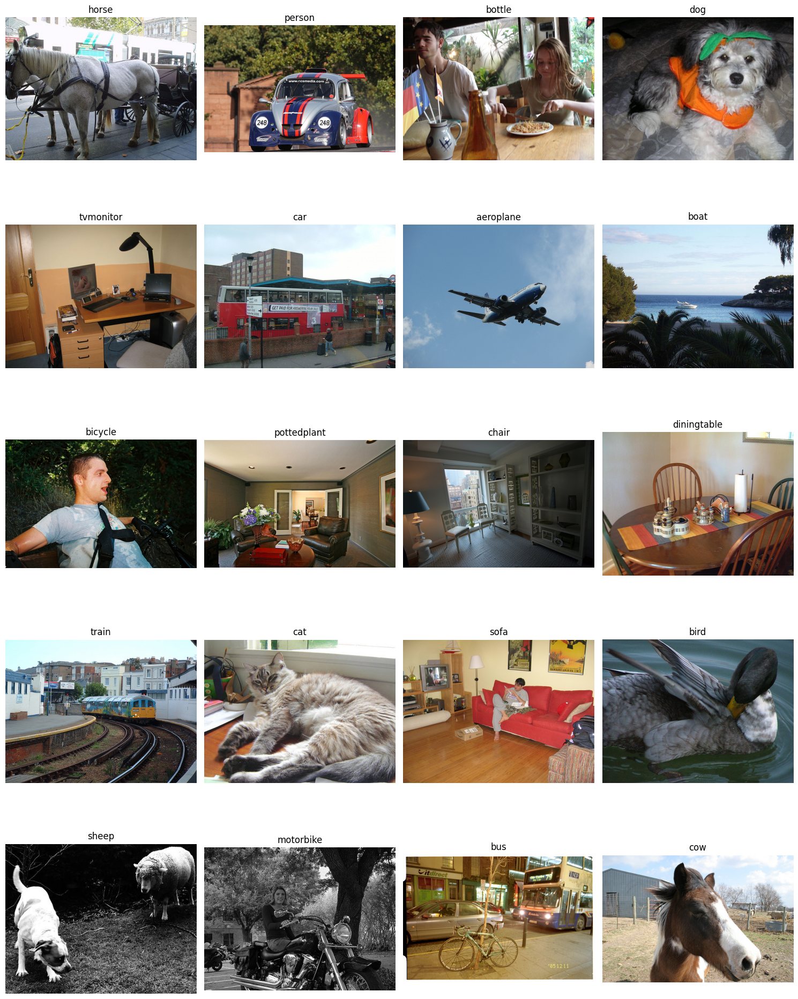

In [8]:
# Plot random images from each category
fig, axs = plt.subplots(5, 4, figsize=(15, 20))

for ax, (category, indices) in zip(axs.flat, index_location.items()):
    # Randomly select an index from the list of indices
    selected_index = rng.choice(indices)

    # Plot the corresponding image - need to permute to get channels last for matplotlib
    ax.imshow(np.moveaxis(img_list[selected_index], 0, -1))
    ax.set_title(category)
    ax.axis("off")

plt.tight_layout()
plt.show()

In [9]:
# This cell takes about 5-10 minutes to run depending on your hardware

# Create the stat classes
img_stats = ImageStats()
chan_stats = ChannelStats()

# Update the stat classes with the images
# Note: the stat classes expect the image as an iterable and in the (C,H,W) format
img_stats.update(img_list)
chan_stats.update(img_list)

# Calculate the raw stats for the dataset
# The output from compute is a dictionary that contains the raw values for each metric
dataset_stats = img_stats.compute()
ds_channel_stats = chan_stats.compute()

# View the list of metrics in the image stats class
list(dataset_stats.keys())

['xxhash',
 'pchash',
 'width',
 'height',
 'size',
 'aspect_ratio',
 'channels',
 'depth',
 'mean',
 'std',
 'var',
 'skew',
 'kurtosis',
 'entropy',
 'percentiles',
 'histogram',
 'brightness',
 'blurriness',
 'missing',
 'zero']

In [10]:
# View the list of metrics in the channel stats class
list(ds_channel_stats.keys())

['idx_map',
 'mean',
 'std',
 'var',
 'skew',
 'kurtosis',
 'entropy',
 'percentiles',
 'histogram']

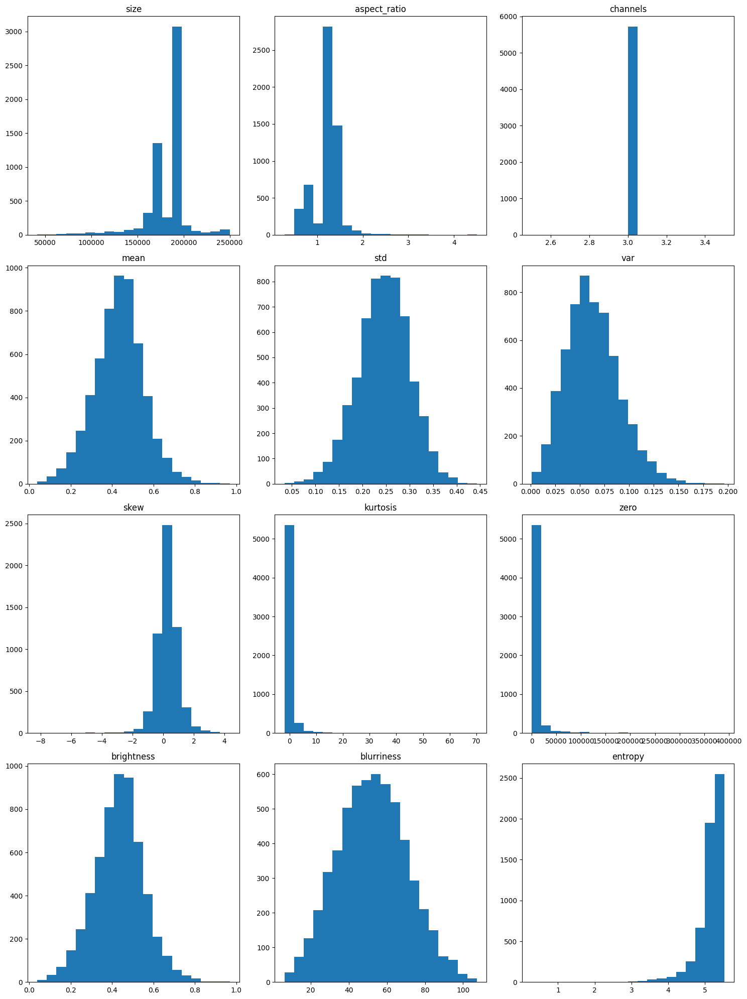

In [11]:
fig, axs = plt.subplots(4, 3, figsize=(15, 20))

for ax, metric in zip(
    axs.flat,
    [
        "size",
        "aspect_ratio",
        "channels",
        "mean",
        "std",
        "var",
        "skew",
        "kurtosis",
        "zero",
        "brightness",
        "blurriness",
        "entropy",
    ],
):
    # Plot the histogram for the chosen metric
    ax.hist(dataset_stats[metric], bins=20)
    ax.set_title(metric)

plt.tight_layout()
plt.show()

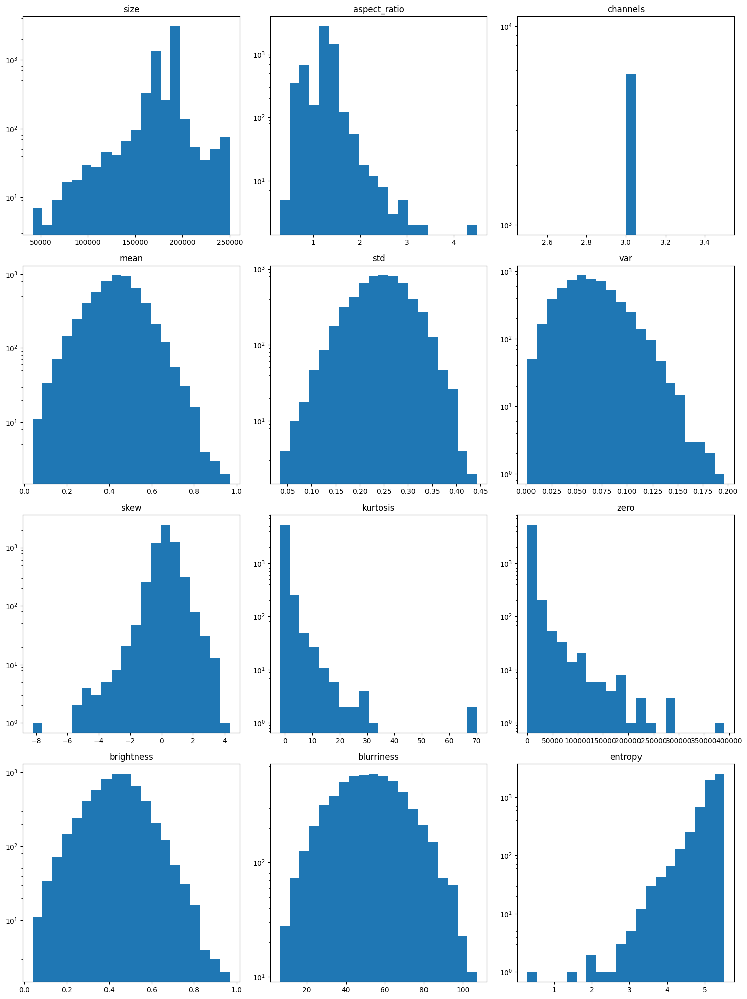

In [12]:
fig, axs = plt.subplots(4, 3, figsize=(15, 20))

for ax, metric in zip(
    axs.flat,
    [
        "size",
        "aspect_ratio",
        "channels",
        "mean",
        "std",
        "var",
        "skew",
        "kurtosis",
        "zero",
        "brightness",
        "blurriness",
        "entropy",
    ],
):
    # Plot the histogram on a log scale for the chosen metric
    ax.hist(dataset_stats[metric], bins=20, log=True)
    ax.set_title(metric)

plt.tight_layout()
plt.show()

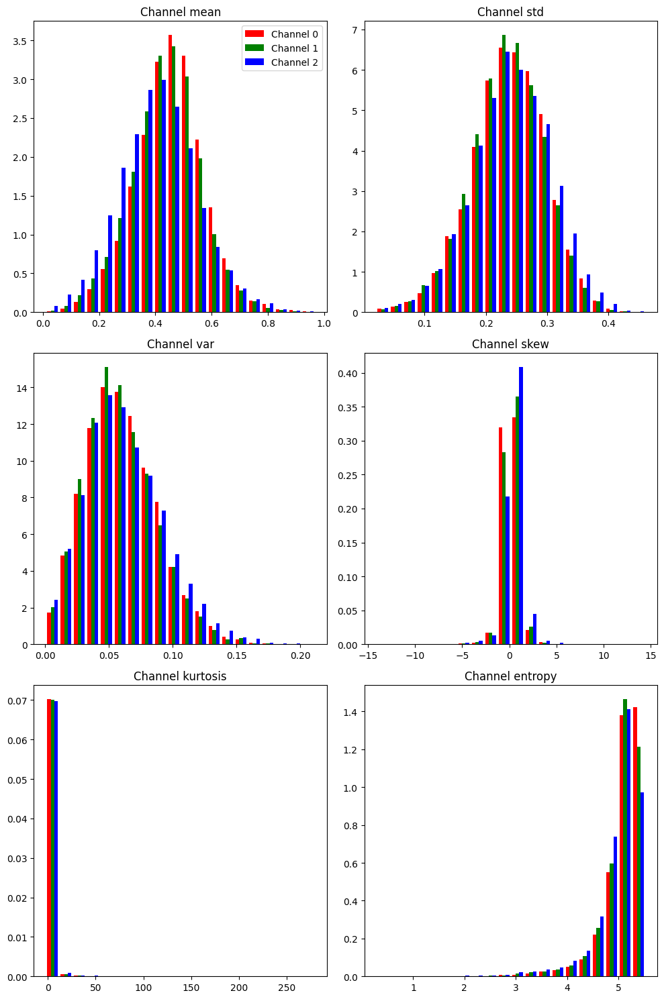

In [13]:
fig, axs = plt.subplots(3, 2, figsize=(10, 15))

for ax, metric in zip(axs.flat, ["mean", "std", "var", "skew", "kurtosis", "entropy"]):
    # Plot the histogram for the chosen metric
    # Since each image has 3 channels, a transpose is needed for matplotlib
    # because matplotlib treats the # of columns as different datasets
    if metric == "mean":
        ax.hist(
            np.array(ds_channel_stats[metric][3]).T,
            bins=20,
            density=True,
            color=["red", "green", "blue"],
            label=["Channel 0", "Channel 1", "Channel 2"],
        )
        ax.legend()
    else:
        ax.hist(np.array(ds_channel_stats[metric][3]).T, bins=20, density=True, color=["red", "green", "blue"])
    ax.set_title(f"Channel {metric}")

plt.tight_layout()
plt.show()

In [14]:
# Initialize the Linter class (with a random image)
lints = Linter(outlier_method="zscore")

# Assign the image stats compute result to the linter class result
lints.results = dataset_stats

# Find the extreme images
lint_imgs = lints._get_outliers()

# View the number of extreme images
print(f"Number of images with extreme values: {len(lint_imgs)}")

Number of images with extreme values: 447


In [15]:
# List the metrics with an extreme value
metrics = {}
for img, group in lint_imgs.items():
    for extreme in group:
        if extreme in metrics:
            metrics[extreme].append(img)
        else:
            metrics[extreme] = [img]
print(f"Number of metrics with extremes: {len(metrics)}")

# Show the total number of extreme values for each metric
for group, imgs in metrics.items():
    print(f"  {group} - {len(imgs)}")

Number of metrics with extremes: 13
  entropy - 124
  zero - 93
  std - 22
  skew - 89
  kurtosis - 73
  size - 173
  mean - 29
  brightness - 29
  aspect_ratio - 33
  var - 35
  width - 43
  height - 22
  blurriness - 2


In [16]:
# Show each metric by class
# Determine which classes are present in each image
class_wise = {obj: {} for obj in sorted(object_counts.keys())}
for group, imgs in metrics.items():
    for img in imgs:
        unique_items = set(labels[img])
        for cat in unique_items:
            if group not in class_wise[cat]:
                class_wise[cat][group] = 0
            class_wise[cat][group] += 1

# Create the table for displaying
table_header = ["      Class"]
for group in sorted(metrics.keys()):
    table_header.append(f"{group:^10}")
table_header.append("  Total")
table = [table_header]
for class_cat, results in class_wise.items():
    table_rows = [f"{class_cat:>11}"]
    total = 0
    for group in sorted(metrics.keys()):
        if group == "aspect_ratio":
            if group in results:
                table_rows.append(f"{results[group]:^12}")
                total += results[group]
            else:
                table_rows.append(f"{0:^12}")
        else:
            if group in results:
                table_rows.append(f"{results[group]:^10}")
                total += results[group]
            else:
                table_rows.append(f"{0:^10}")
    table_rows.append(f"  {total:^5}")
    table.append(table_rows)

# Display the table
for row in table:
    print(" | ".join(row))

      Class | aspect_ratio | blurriness | brightness |  entropy   |   height   |  kurtosis  |    mean    |    size    |    skew    |    std     |    var     |   width    |    zero    |   Total
  aeroplane |      7       |     0      |     7      |     28     |     5      |     23     |     7      |     12     |     30     |     6      |     1      |     1      |     2      |    129 
    bicycle |      0       |     0      |     1      |     3      |     0      |     2      |     1      |     10     |     3      |     0      |     0      |     5      |     3      |    28  
       bird |      3       |     0      |     1      |     16     |     1      |     12     |     1      |     10     |     14     |     5      |     0      |     1      |     9      |    73  
       boat |      7       |     0      |     1      |     6      |     4      |     2      |     1      |     8      |     3      |     2      |     0      |     0      |     0      |    34  
     bottle |      1       |     0 

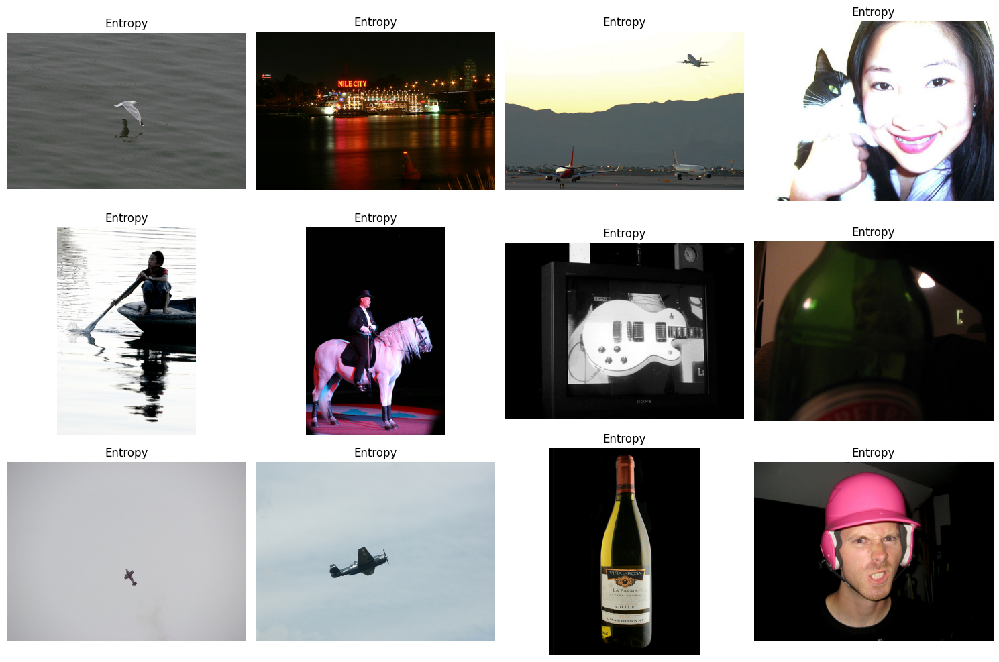

In [17]:
# Plot random images from each metric
fig, axs = plt.subplots(3, 4, figsize=(15, 10))
selected_index = rng.choice(metrics["entropy"], 12, replace=False)

for i, ax in enumerate(axs.flat):
    # Plot the corresponding image - need to permute to get channels last for matplotlib
    ax.imshow(np.moveaxis(img_list[selected_index[i]], 0, -1))
    ax.set_title("Entropy")
    ax.axis("off")

plt.tight_layout()
plt.show()

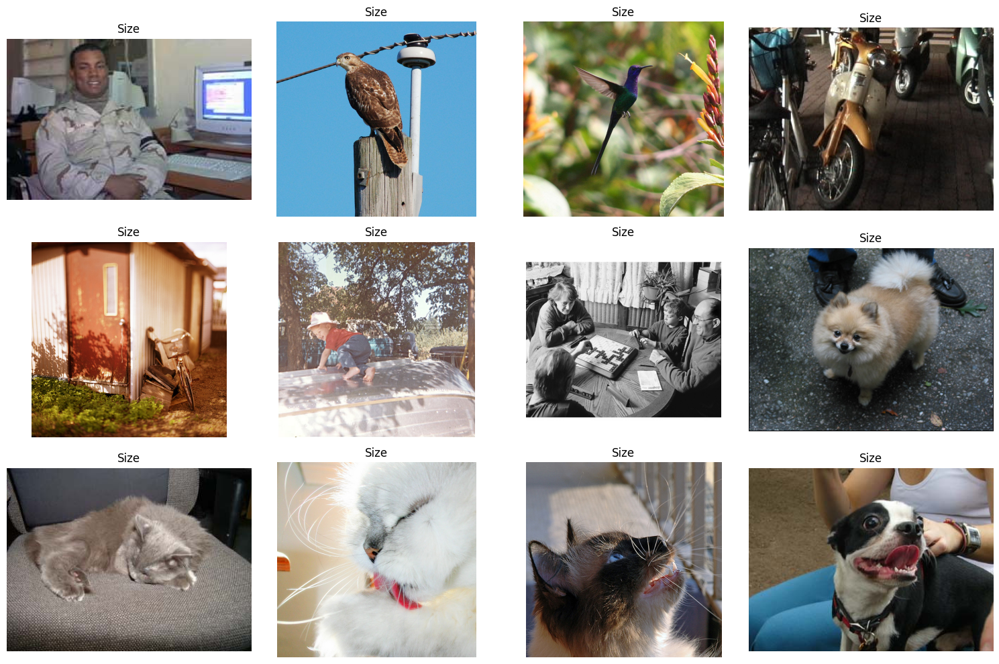

In [18]:
# Plot random images from each metric
fig, axs = plt.subplots(3, 4, figsize=(15, 10))
selected_index = rng.choice(metrics["size"], 12, replace=False)

for i, ax in enumerate(axs.flat):
    # Plot the corresponding image - need to permute to get channels last for matplotlib
    ax.imshow(np.moveaxis(img_list[selected_index[i]], 0, -1))
    ax.set_title("Size")
    ax.axis("off")

plt.tight_layout()
plt.show()

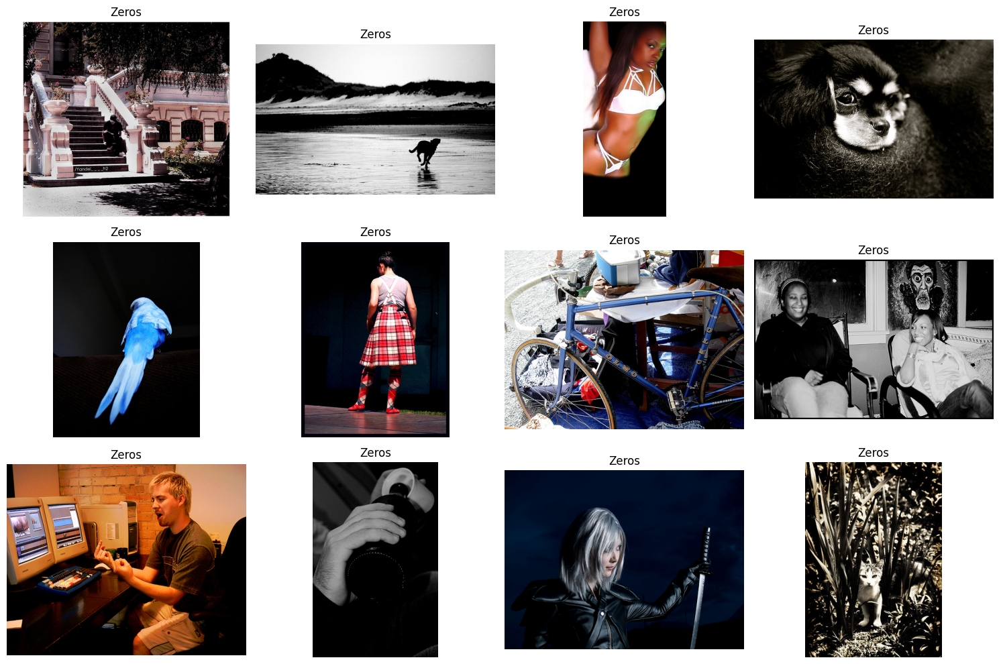

In [19]:
# Plot random images from each metric
fig, axs = plt.subplots(3, 4, figsize=(15, 10))
selected_index = rng.choice(metrics["zero"], 12, replace=False)

for i, ax in enumerate(axs.flat):
    # Plot the corresponding image - need to permute to get channels last for matplotlib
    ax.imshow(np.moveaxis(img_list[selected_index[i]], 0, -1))
    ax.set_title("Zeros")
    ax.axis("off")

plt.tight_layout()
plt.show()

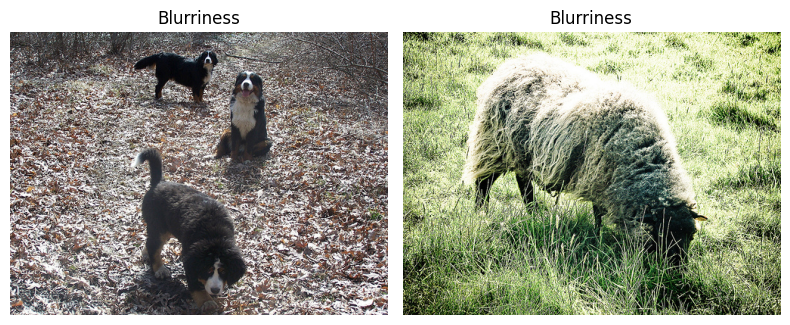

In [20]:
# Plot random images from each metric
fig, axs = plt.subplots(1, 2, figsize=(8, 4))
selected_index = metrics["blurriness"]

for i, ax in enumerate(axs.flat):
    # Plot the corresponding image - need to permute to get channels last for matplotlib
    ax.imshow(np.moveaxis(img_list[selected_index[i]], 0, -1))
    ax.set_title("Blurriness")
    ax.axis("off")

plt.tight_layout()
plt.show()

In [21]:
# Initialize the Duplicates class (with a random image)
dups = Duplicates()

# Assign the image stats compute result to the duplicates class result
dups.results = dataset_stats

# Find the duplicates
dup_imgs = dups._get_duplicates()

# View the duplicates
dup_imgs

{'exact': [], 'near': []}

In [22]:
# Copy images to create exact duplicates
img_list2 = [img_list[23], img_list[46]]

# Copy and crop images to create near duplicates
img5 = img_list[5][:, 5:-5, 5:-5]
img4376 = img_list[4376][:, :-5, 5:]

img_list2.extend([img5, img4376])

In [23]:
# Add in the new images to the image stats class
img_stats.update(img_list2)

# Recompute the stats
ds_with_duplicates = img_stats.compute()

# Assign the compute result to the duplicates class result
dups.results = ds_with_duplicates

# Find the duplicates
dup_imgs = dups._get_duplicates()

# View the duplicates
dup_imgs

{'exact': [[23, 5717], [46, 5718]], 'near': [[5, 5719], [4376, 5720]]}

In [24]:
# Define the embedding network
class EmbeddingNet(nn.Module):
    def __init__(self):
        super().__init__()
        self.model = models.resnet18(weights=models.ResNet18_Weights.DEFAULT)
        self.model.fc = nn.Linear(self.model.fc.in_features, 128)

    def forward(self, x):
        x = self.model(x)
        return x


embedding_net = EmbeddingNet()
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
embedding_net.to(device)


# Extract embeddings
def extract_embeddings(dataset, model):
    model.eval()

    embeddings = torch.empty(size=(0, 128)).to(device)
    with torch.no_grad():
        images = []
        for i, (img, _) in enumerate(dataset):
            images.append(img)
            if (i + 1) % 64 == 0:
                inputs = torch.stack(images, dim=0).to(device)
                outputs = model(inputs)
                embeddings = torch.vstack((embeddings, outputs))
                images = []
        inputs = torch.stack(images, dim=0).to(device)
        outputs = model(inputs)
        embeddings = torch.vstack((embeddings, outputs))
    return embeddings.detach().cpu().numpy()

In [25]:
# Define pretrained model transformations
preprocess = models.ResNet18_Weights.DEFAULT.transforms()

# Load the dataset
dataset = datasets.VOCDetection("./data", year="2011", image_set="train", download=False, transform=preprocess)

# Create image embeddings
embeddings = extract_embeddings(dataset, embedding_net)

In [26]:
# This cell takes about 5-10 minutes to run depending on your hardware

# Initialize the Clusterer class (with the embedded images)
cluster = Clusterer(embeddings)

# Find the outlier images
results = cluster.evaluate()

# View the number of outliers
print(f"Number of outliers: {len(results['outliers'])}")
print(f"Number of potential outliers: {len(results['potential_outliers'])}")

Number of outliers: 486
Number of potential outliers: 3508


/workspaces/dataeval/.tox/qdocs/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/workspaces/dataeval/.tox/qdocs/lib/python3.11/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


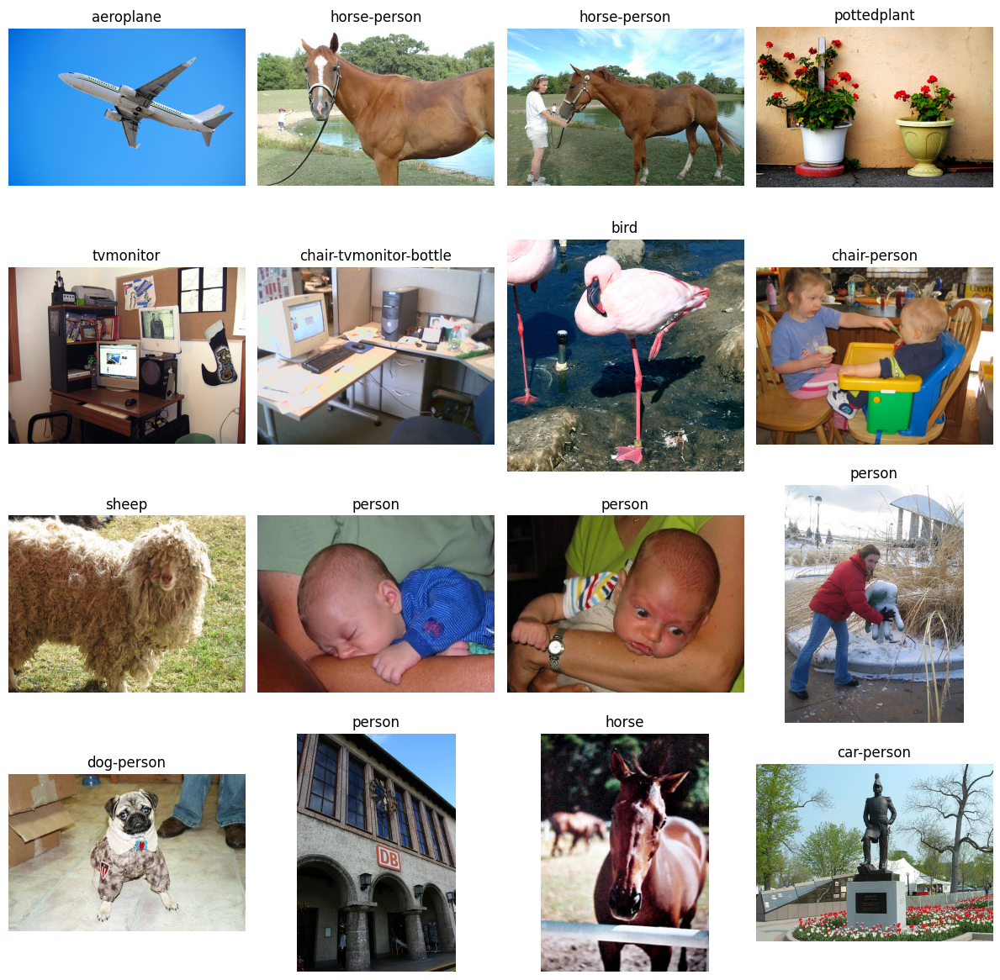

In [27]:
# Plot random images from each category
fig, axs = plt.subplots(4, 4, figsize=(12, 12))

for i, ax in enumerate(axs.flat):
    # Selected image
    selected_index = results["outliers"][i]

    # Plot the corresponding image - need to permute to get channels last for matplotlib
    ax.imshow(np.moveaxis(img_list[selected_index], 0, -1))
    ax.set_title("-".join(set(labels[selected_index])))
    ax.axis("off")

plt.tight_layout()
plt.show()